# Imports

In [15]:
import MySQLdb as sql
import h5py
from earth.utils import generateFilePathStr
import numpy as np
import random
import pandas as pd
from PIL import Image

from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn import tree
from sklearn.ensemble import RandomForestClassifier
import tensorflow as tf

import plotly.offline as plotly
import plotly.graph_objs as go
plotly.init_notebook_mode(connected=True)

# Generate Datasets

In [72]:
bands = ['B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'B7']

In [175]:
db = sql.connect(db='earthdat', host='104.199.118.158', user='root')
cur = db.cursor()
cur.execute('SELECT lid, x_coord, y_coord, label FROM cloud_detection_kmeans2 WHERE lid="LC80151132017042LGN00" ORDER BY RAND() LIMIT 5000 ;')
results = cur.fetchall()
db.close()

In [174]:
grid_size = 16
dataset = np.empty((5000, grid_size ** 2 * len(bands)))
labels = np.full((5000,), 2, dtype='uint8')
lids = []
with h5py.File(generateFilePathStr(kind='database'), 'r') as h:
    i = 0
    for lid, x, y, status in results:
        subimage = np.zeros((len(bands), grid_size**2))
        for j, b in enumerate(bands):
            subimage[j] = h[lid][b][
                x - int(grid_size / 2) : x + int(grid_size / 2),
                y - int(grid_size / 2) : y + int(grid_size / 2)
            ].flatten()
        dataset[i] = subimage.flatten()
        labels[i] = status
        lids.append(lid)
        i += 1

dataset = dataset[labels!=2]
lids = pd.Series(lids)[labels!=2]
labels = labels[labels!=2].astype('int')

# Scatter Plots

In [119]:
dataset = np.append(dataset, labels.reshape(8189, 1), axis=1)

In [169]:
ind = pd.Series(np.arange(len(lids)))

In [177]:
tsne = TSNE(2)
ld_dataset = tsne.fit_transform(dataset)

In [179]:
figs = []

# for l in lids.unique()[:10]:
#     figs.append(go.Scatter(
#         x=ld_dataset[lids==l][:,0],
#         y=ld_dataset[lids==l][:,1],
#         marker={'size': 5},
#         mode="markers",
#         text=ind[labels == 0]
#     ))
    
fig0 = go.Scatter(
    x=ld_dataset[labels == 0][:,0],
    y=ld_dataset[labels == 0][:,1],
    marker={'size': 5},
    mode="markers",
    text=ind[labels == 0]
)

fig1 = go.Scatter(
    x=ld_dataset[labels == 1][:,0],
    y=ld_dataset[labels == 1][:,1],
    marker={'size': 5},
    mode="markers",
    text=ind[labels == 1]
)

figs = [fig0, fig1]

plotly.plot(figs)

'file:///opt/earth/earth/projects/land_class/research/temp-plot.html'

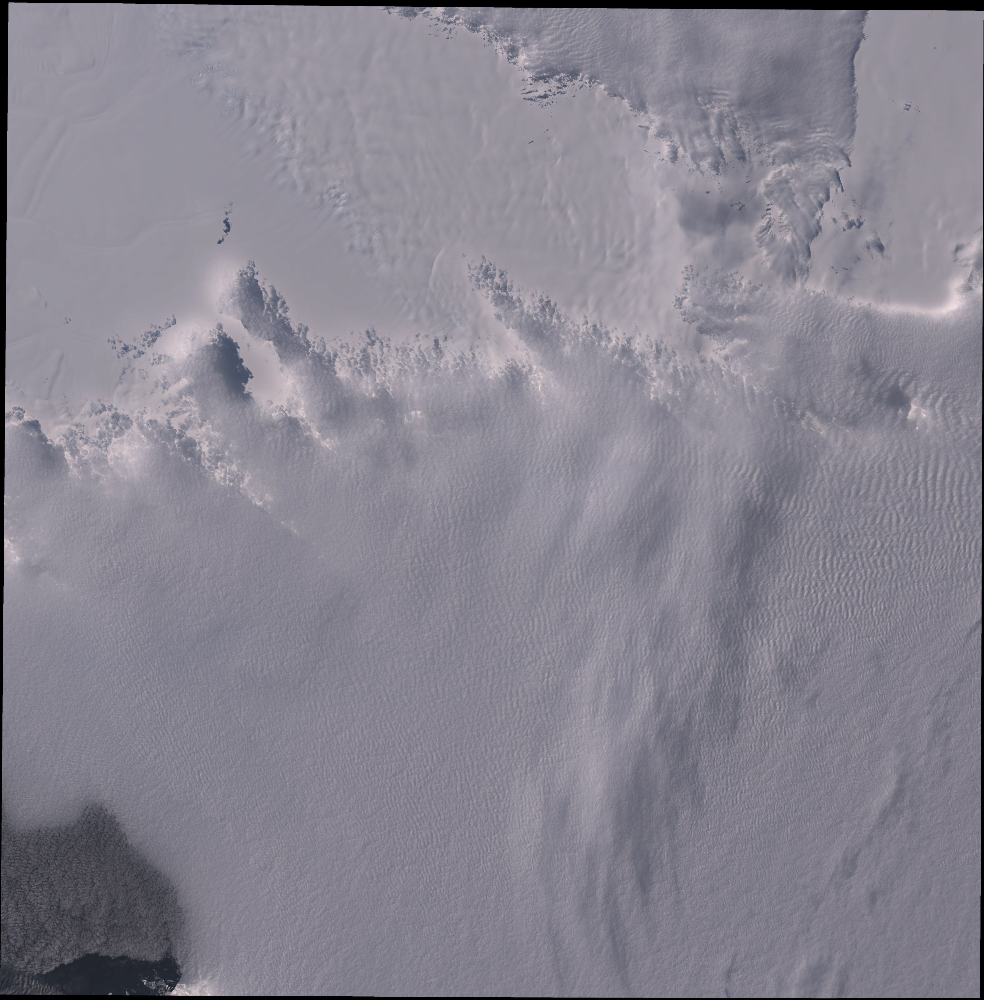

In [180]:
Image.open(generateFilePathStr('LC80151132017042LGN00', 'preproc', 'visible'))